In [1]:
import warnings
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
from sklearn.preprocessing import LabelEncoder
from scipy import stats

In [2]:
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

In [3]:
df = pd.read_excel('customer_retention_dataset.xlsx')
df

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [4]:
df.columns

Index(['1Gender of respondent', '2 How old are you? ',
       '3 Which city do you shop online from?',
       '4 What is the Pin Code of where you shop online from?',
       '5 Since How Long You are Shopping Online ?',
       '6 How many times you have made an online purchase in the past 1 year?',
       '7 How do you access the internet while shopping on-line?',
       '8 Which device do you use to access the online shopping?',
       '9 What is the screen size of your mobile device?\t\t\t\t\t\t                                        ',
       '10 What is the operating system (OS) of your device?\t\t\t\t                                          ',
       '11 What browser do you run on your device to access the website?\t\t\t                                                          ',
       '12 Which channel did you follow to arrive at your favorite online store for the first time?                                                                   ',
       '13 After first visit, how 

In [5]:
df.columns = [
    'Gender',
    'Age',
    'shop_online_from_city',
    'Pin Code you shop online',
    'How Long You are Shopping Online',
    'How many times you have made an online purchase in past 1 year',
    'How you access internet while shopping on-line',
    'device you use to access online shopping',
    'screen size of your mobile device',
    'OS of your device',
    'browser you run on device to access website',
    'channel did you follow to arrive at your favorite online store for first time',
    'After first visit, how you reach online retail store',
    'time you explore e- retail store before making a purchase decision',
    'preferred payment Option',
    'How frequently you abandon shopping cart',
    'Why did you abandon Shopping Cart',
    'content on website must be easy to read and understand',
    'Information on similar product to one highlighted is important for product comparison',
    'Complete information on listed seller and product being offered is important for purchase decision.',
    'All relevant information on listed products must be stated clearly',
    'Ease of navigation in website',
    'Loading and processing speed',
    'User friendly Interface of website',
    'Convenient Payment methods',
    'Trust that online retail store will fulfill its part of transaction at stipulated time',
    'Empathy towards customers',
    'guarantee privacy of customer',
    'availability of several communication channels',
    'Online shopping gives monetary benefit and discounts',
    'Enjoyment is derived from shopping online',
    'Shopping online is convenient and flexible',
    'Return and replacement policy is important for purchase decision',
    'Gaining access to loyalty programs is a benefit of shopping online',
    'Displaying quality Information on website improves satisfaction',
    'User derive satisfaction while shopping on a good quality website or application',
    'Net Benefit derived from shopping online can lead to users satisfaction',
    'User satisfaction cannot exist without trust',
    'Offering a wide variety of listed product in several category',
    'Provision of complete and relevant product information',
    'Monetary savings',
    'Convenience of patronizing online retailer',
    'Shopping on website gives you sense of adventure',
    'Shopping on your preferred e-tailer enhances your social status',
    'You feel gratification shopping on your favorite e-tailer',
    'Shopping on website helps you fulfill certain roles',
    'Getting value for money spent',
    'online retailers you have shopped from',
    'Easy to use website or application',
    'Visual appealing web-page layout', 
    'Wild variety of product on offer',
    'Complete, relevant description information of products',
    'Fast loading website speed of website and application',
    'Reliability of website or application',
    'Quickness to complete purchase',
    'Availability of several payment options', 
    'Speedy order delivery ',
    'Privacy of customers’ information',
    'Security of customer financial information',
    'Perceived Trustworthiness',
    'Presence of online assistance through multi-channel',
    'Longer time to get logged in',
    'Longer time in displaying graphics and photos',
    'Late declaration of price',
    'Longer page loading time',
    'Limited mode of payment on most products',
    'Longer delivery period',
    'Change in website/Application design',
    'Frequent disruption when moving from one page to anr',
    'Website is as efficient as before',
    'Indian online retailer would you recommend to a friend'
]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                                                                                               Non-Null Count  Dtype 
---  ------                                                                                               --------------  ----- 
 0   Gender                                                                                               269 non-null    object
 1   Age                                                                                                  269 non-null    object
 2   shop_online_from_city                                                                                269 non-null    object
 3   Pin Code you shop online                                                                             269 non-null    int64 
 4   How Long You are Shopping Online                                                                     269 non-null   

In [7]:
for one_column in df.columns:
    print(df[one_column].value_counts())
    print('_'*50)
    print('_'*50)
    
    

Female    181
Male       88
Name: Gender, dtype: int64
__________________________________________________
__________________________________________________
31-40 years           81
21-30 years           79
41-50 yaers           70
Less than 20 years    20
51 years and above    19
Name: Age, dtype: int64
__________________________________________________
__________________________________________________
Delhi            58
Greater Noida    43
Noida            40
Bangalore        37
Karnal           27
Ghaziabad        18
Solan            18
Gurgaon          12
Merrut            9
Moradabad         5
Bulandshahr       2
Name: shop_online_from_city, dtype: int64
__________________________________________________
__________________________________________________
201308    38
132001    19
201310    18
110044    16
173229     9
173212     9
250001     9
122018     8
560037     8
132036     8
560010     8
110011     7
110008     7
201306     7
110014     6
110018     6
201008     5
201009 

Amazon.in                             94
Flipkart.com                          47
Amazon.in, Flipkart.com               45
Amazon.in, Flipkart.com, Paytm.com    25
Amazon.in, Paytm.com                  18
Paytm.com                             15
Myntra.com, Snapdeal.com              14
Snapdeal.com                          11
Name: Website is as efficient as before, dtype: int64
__________________________________________________
__________________________________________________
Amazon.in                                            79
Amazon.in, Flipkart.com                              62
Flipkart.com                                         39
Amazon.in, Myntra.com                                30
Amazon.in, Paytm.com, Myntra.com                     20
Amazon.in, Flipkart.com, Myntra.com                  15
Amazon.in, Paytm.com                                 13
Flipkart.com, Paytm.com, Myntra.com, snapdeal.com    11
Name: Indian online retailer would you recommend to a friend, dtype:

#### Removing same value and mergeing it

In [8]:
df['How you access internet while shopping on-line'].value_counts()

Mobile internet    142
Wi-Fi               76
Mobile Internet     47
Dial-up              4
Name: How you access internet while shopping on-line, dtype: int64

In [9]:
df['How you access internet while shopping on-line'] = df['How you access internet while shopping on-line'].str.lower()

In [10]:
df['How you access internet while shopping on-line'].value_counts()

mobile internet    189
wi-fi               76
dial-up              4
Name: How you access internet while shopping on-line, dtype: int64

In [11]:
target_column_name = 'Indian online retailer would you recommend to a friend'

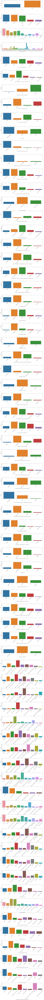

In [12]:
plt.figure(figsize=[16,400])
j = 0 
for column, dtype in df.dtypes.items():
    plt.subplot(len(df.columns),1,j+1)  
    plt.xticks(rotation=45)
    plt.subplots_adjust(hspace=1)
    sns.countplot(df[column],)
    j += 1

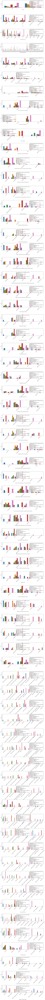

In [13]:
plt.figure(figsize=[16,400])
j = 0 
for column, dtype in df.drop(target_column_name,axis=1).dtypes.items():
    plt.subplot(len(df.columns),1,j+1)  
    plt.xticks(rotation=45)
    plt.subplots_adjust(hspace=1)
    sns.countplot(data=df,x=column,hue=target_column_name)
    j += 1

In [14]:
df_stcked = df.drop(target_column_name, axis=1).join(df[target_column_name] \
                                         .str.split(',', expand=True)\
                                         .stack().reset_index(level=1, drop=True)\
                                         .rename(target_column_name)
                                        )

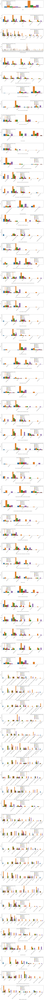

In [15]:
plt.figure(figsize=[16,400])
j = 0 
for column, dtype in df_stcked.drop(target_column_name,axis=1).dtypes.items():
    plt.subplot(len(df_stcked.columns),1,j+1)  
    plt.xticks(rotation=45)
    plt.subplots_adjust(hspace=1)
    sns.countplot(data=df_stcked,x=column,hue=target_column_name)
    j += 1

In [16]:
# Gender vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','Gender']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,Gender,0
0,Amazon.in,Female,152
1,Amazon.in,Male,67
2,Flipkart.com,Female,56
3,Myntra.com,Female,53
4,Flipkart.com,Female,29
5,Paytm.com,Female,28
6,Myntra.com,Male,23
7,Flipkart.com,Male,21
8,Flipkart.com,Male,21
9,Paytm.com,Male,16


In [17]:
# Age vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','Age']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,Age,0
0,Amazon.in,21-30 years,68
1,Amazon.in,41-50 yaers,59
2,Amazon.in,31-40 years,54
3,Flipkart.com,21-30 years,29
4,Myntra.com,21-30 years,29
5,Flipkart.com,31-40 years,27
6,Flipkart.com,31-40 years,21
7,Amazon.in,Less than 20 years,20
8,Myntra.com,41-50 yaers,20
9,Paytm.com,41-50 yaers,18


In [18]:
# shop_online_from_city vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','shop_online_from_city']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,shop_online_from_city,0
0,Amazon.in,Greater Noida,42
1,Amazon.in,Delhi,37
2,Amazon.in,Bangalore,32
3,Amazon.in,Noida,29
4,Flipkart.com,Greater Noida,24
5,Myntra.com,Greater Noida,22
6,Flipkart.com,Delhi,21
7,Amazon.in,Karnal,21
8,Amazon.in,Solan,18
9,Myntra.com,Delhi,18


In [19]:
# Pin Code you shop online vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','Pin Code you shop online']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,Pin Code you shop online,0
0,Amazon.in,201308,35
1,Paytm.com,201308,22
2,Myntra.com,201308,20
3,Amazon.in,201310,15
4,Amazon.in,132001,13
...,...,...,...
98,Paytm.com,201306,1
99,Paytm.com,560001,1
100,snapdeal.com,110008,1
101,snapdeal.com,110018,1


In [20]:
# How Long You are Shopping Online vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','How Long You are Shopping Online']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,How Long You are Shopping Online,0
0,Amazon.in,Above 4 years,73
1,Amazon.in,2-3 years,63
2,Amazon.in,3-4 years,40
3,Flipkart.com,Above 4 years,34
4,Amazon.in,Less than 1 year,33
5,Flipkart.com,Above 4 years,25
6,Myntra.com,2-3 years,25
7,Myntra.com,Above 4 years,23
8,Paytm.com,Above 4 years,19
9,Flipkart.com,2-3 years,18


In [21]:
# How many times you have made an online purchase in past 1 year vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','How many times you have made an online purchase in past 1 year']).size().sort_values(0,ascending=False,).reset_index()


,Indian online retailer would you recommend to a friend,How many times you have made an online purchase in past 1 year,0
0,Amazon.in,Less than 10 times,93
1,Amazon.in,31-40 times,44
2,Amazon.in,41 times and above,43
3,Flipkart.com,Less than 10 times,41
4,Amazon.in,11-20 times,23
5,Flipkart.com,Less than 10 times,21
6,Myntra.com,31-40 times,20
7,Flipkart.com,31-40 times,19
8,Myntra.com,Less than 10 times,17
9,Myntra.com,11-20 times,16


In [22]:
# How you access internet while shopping on-line vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','How you access internet while shopping on-line']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,How you access internet while shopping on-line,0
0,Amazon.in,mobile internet,156
1,Amazon.in,wi-fi,63
2,Myntra.com,mobile internet,50
3,Flipkart.com,mobile internet,48
4,Flipkart.com,mobile internet,33
5,Flipkart.com,wi-fi,29
6,Paytm.com,mobile internet,29
7,Myntra.com,wi-fi,26
8,Paytm.com,wi-fi,15
9,Flipkart.com,wi-fi,13


In [23]:
# device you use to access online shopping vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','device you use to access online shopping']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,device you use to access online shopping,0
0,Amazon.in,Smartphone,133
1,Amazon.in,Laptop,67
2,Myntra.com,Smartphone,48
3,Flipkart.com,Laptop,46
4,Paytm.com,Smartphone,31
5,Flipkart.com,Smartphone,31
6,Flipkart.com,Laptop,19
7,Myntra.com,Laptop,18
8,Amazon.in,Desktop,17
9,Flipkart.com,Desktop,13


In [24]:
# screen size of your mobile device vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','screen size of your mobile device']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,screen size of your mobile device,0
0,Amazon.in,5.5 inches,99
1,Amazon.in,Others,84
2,Flipkart.com,Others,50
3,Flipkart.com,Others,46
4,Flipkart.com,5.5 inches,31
5,Paytm.com,5.5 inches,31
6,Myntra.com,4.7 inches,29
7,Amazon.in,4.7 inches,29
8,Myntra.com,Others,28
9,Myntra.com,5.5 inches,19


In [25]:
# OS of your device vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','OS of your device']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,OS of your device,0
0,Amazon.in,Window/windows Mobile,90
1,Amazon.in,Android,67
2,Amazon.in,IOS/Mac,62
3,Flipkart.com,Window/windows Mobile,45
4,Paytm.com,Android,41
5,Flipkart.com,IOS/Mac,32
6,Flipkart.com,Window/windows Mobile,32
7,Myntra.com,IOS/Mac,30
8,Myntra.com,Android,29
9,Flipkart.com,Android,18


In [26]:
# browser you run on device to access website vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','browser you run on device to access website']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,browser you run on device to access website,0
0,Amazon.in,Google chrome,166
1,Myntra.com,Google chrome,61
2,Flipkart.com,Google chrome,52
3,Flipkart.com,Google chrome,50
4,Paytm.com,Google chrome,44
5,Amazon.in,Safari,40
6,Flipkart.com,Safari,25
7,Myntra.com,Safari,15
8,snapdeal.com,Google chrome,11
9,Amazon.in,Opera,8


In [27]:
# channel did you follow to arrive at your favorite online store for first time vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','channel did you follow to arrive at your favorite online store for first time']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,channel did you follow to arrive at your favorite online store for first time,0
0,Amazon.in,Search Engine,191
1,Flipkart.com,Search Engine,77
2,Myntra.com,Search Engine,50
3,Flipkart.com,Search Engine,39
4,Paytm.com,Search Engine,33
5,Amazon.in,Content Marketing,20
6,Myntra.com,Content Marketing,15
7,Myntra.com,Display Adverts,11
8,Paytm.com,Display Adverts,11
9,snapdeal.com,Display Adverts,11


In [28]:
# After first visit, how you reach online retail store vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','After first visit, how you reach online retail store']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,"After first visit, how you reach online retail store",0
0,Amazon.in,Via application,78
1,Amazon.in,Direct URL,59
2,Amazon.in,Search Engine,56
3,Myntra.com,Via application,50
4,Flipkart.com,Search Engine,43
5,Flipkart.com,Direct URL,34
6,Paytm.com,Via application,33
7,Flipkart.com,Search Engine,31
8,Myntra.com,Direct URL,26
9,Amazon.in,E-mail,18


In [29]:
# time you explore e- retail store before making a purchase decision vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','time you explore e- retail store before making a purchase decision']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,time you explore e- retail store before making a purchase decision,0
0,Amazon.in,more than 15 mins,93
1,Amazon.in,6-10 mins,59
2,Myntra.com,more than 15 mins,56
3,Amazon.in,11-15 mins,46
4,Flipkart.com,more than 15 mins,34
5,Flipkart.com,more than 15 mins,30
6,Flipkart.com,6-10 mins,25
7,Paytm.com,more than 15 mins,24
8,Myntra.com,11-15 mins,20
9,Paytm.com,11-15 mins,20


In [30]:
# preferred payment Option vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','preferred payment Option']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,preferred payment Option,0
0,Amazon.in,Credit/Debit cards,137
1,Flipkart.com,Credit/Debit cards,70
2,Myntra.com,Credit/Debit cards,56
3,Amazon.in,Cash on delivery (CoD),49
4,Paytm.com,"E-wallets (Paytm, Freecharge etc.)",33
5,Amazon.in,"E-wallets (Paytm, Freecharge etc.)",33
6,Flipkart.com,Cash on delivery (CoD),27
7,Myntra.com,"E-wallets (Paytm, Freecharge etc.)",20
8,Flipkart.com,"E-wallets (Paytm, Freecharge etc.)",12
9,Paytm.com,Credit/Debit cards,11


In [31]:
# How frequently you abandon shopping cart vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','How frequently you abandon shopping cart']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,How frequently you abandon shopping cart,0
0,Amazon.in,Sometimes,121
1,Flipkart.com,Sometimes,50
2,Amazon.in,Never,48
3,Myntra.com,Sometimes,46
4,Flipkart.com,Sometimes,45
5,Amazon.in,Frequently,35
6,Paytm.com,Sometimes,31
7,Flipkart.com,Never,25
8,Myntra.com,Frequently,15
9,Myntra.com,Very frequently,15


In [32]:
# Why did you abandon Shopping Cart vs Indian online retailer would you recommend to a friend
df_stcked.groupby(['Indian online retailer would you recommend to a friend','Why did you abandon Shopping Cart']).size().sort_values(0,ascending=False,).reset_index()

,Indian online retailer would you recommend to a friend,Why did you abandon Shopping Cart,0
0,Amazon.in,Better alternative offer,133
1,Flipkart.com,Better alternative offer,77
2,Myntra.com,Promo code not applicable,46
3,Amazon.in,Promo code not applicable,43
4,Paytm.com,Promo code not applicable,31
5,Flipkart.com,Lack of trust,31
6,Myntra.com,Better alternative offer,30
7,Amazon.in,Change in price,29
8,Amazon.in,No preferred mode of payment,14
9,Paytm.com,Better alternative offer,13


In [33]:
df = df.apply(LabelEncoder().fit_transform)
df

,Gender,Age,shop_online_from_city,Pin Code you shop online,How Long You are Shopping Online,How many times you have made an online purchase in past 1 year,How you access internet while shopping on-line,device you use to access online shopping,screen size of your mobile device,OS of your device,browser you run on device to access website,channel did you follow to arrive at your favorite online store for first time,"After first visit, how you reach online retail store",time you explore e- retail store before making a purchase decision,preferred payment Option,How frequently you abandon shopping cart,Why did you abandon Shopping Cart,content on website must be easy to read and understand,Information on similar product to one highlighted is important for product comparison,Complete information on listed seller and product being offered is important for purchase decision.,All relevant information on listed products must be stated clearly,Ease of navigation in website,Loading and processing speed,User friendly Interface of website,Convenient Payment methods,Trust that online retail store will fulfill its part of transaction at stipulated time,Empathy towards customers,guarantee privacy of customer,availability of several communication channels,Online shopping gives monetary benefit and discounts,Enjoyment is derived from shopping online,Shopping online is convenient and flexible,Return and replacement policy is important for purchase decision,Gaining access to loyalty programs is a benefit of shopping online,Displaying quality Information on website improves satisfaction,User derive satisfaction while shopping on a good quality website or application,Net Benefit derived from shopping online can lead to users satisfaction,User satisfaction cannot exist without trust,Offering a wide variety of listed product in several category,Provision of complete and relevant product information,Monetary savings,Convenience of patronizing online retailer,Shopping on website gives you sense of adventure,Shopping on your preferred e-tailer enhances your social status,You feel gratification shopping on your favorite e-tailer,Shopping on website helps you fulfill certain roles,Getting value for money spent,online retailers you have shopped from,Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,Longer time to get logged in,Longer time in displaying graphics and photos,Late declaration of price,Longer page loading time,Limited mode of payment on most products,Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to anr,Website is as efficient as before,Indian online retailer would you recommend to a friend
0,1,1,2,1,3,2,0,0,3,2,0,2,2,2,2,2,2,0,2,2,0,0,4,1,1,1,1,0,0,4,3,1,1,0,2,2,0,2,3,3,1,2,0,0,2,0,1,7,9,7,5,10,9,9,8,9,0,0,0,7,9,0,0,3,5,0,3,2,0,0,6
1,0,0,2,5,3,3,2,2,0,1,0,2,4,4,1,3,4,2,3,3,2,2,3,3,2,2,1,1,1,2,2,2,2,2,1,2,2,2,2,2,2,2,4,4,2,2,1,2,3,5,6,2,2,8,2,2,1,9,9,8,2,1,6,7,10,7,5,0,4,1,3
2,0,0,4,23,2,3,1,2,2,0,0,2,4,1,2,2,4,2,0,0,0,0,0,3,2,2,1,1,1,2,2,2,2,2,1,2,2,0,2,2,2,0,0,0,4,4,0,8,7,6,4,7,7,6,5,10,0,0,6,6,8,7,6,4,7,0,3,5,6,0,5
3,1,0,6,11,2,5,1,2,2,1,3,2,2,2,1,1,0,0,0,2,0,2,0,3,2,0,1,1,0,0,4,3,0,4,2,0,3,0,0,0,2,0,0,2,0,4,0,4,4,3,1,1,6,3,3,2,3,2,5,5,3,9,7,4,8,5,3,1,1,2,1
4,0,0,0,31,1,0,2,2,0,1,3,0,4,4,1,0,0,2,2,2,0,0,3,3,2,0,1,0,1,2,2,2,2,1,0,2,2,2,0,0,2,0,4,3,2,3,1,4,4,9,7,5,0,6,4,4,0,7,10,6,5,5,8,5,8,7,3,0,7,6,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [34]:
df.corr()

,Gender,Age,shop_online_from_city,Pin Code you shop online,How Long You are Shopping Online,How many times you have made an online purchase in past 1 year,How you access internet while shopping on-line,device you use to access online shopping,screen size of your mobile device,OS of your device,browser you run on device to access website,channel did you follow to arrive at your favorite online store for first time,"After first visit, how you reach online retail store",time you explore e- retail store before making a purchase decision,preferred payment Option,How frequently you abandon shopping cart,Why did you abandon Shopping Cart,content on website must be easy to read and understand,Information on similar product to one highlighted is important for product comparison,Complete information on listed seller and product being offered is important for purchase decision.,All relevant information on listed products must be stated clearly,Ease of navigation in website,Loading and processing speed,User friendly Interface of website,Convenient Payment methods,Trust that online retail store will fulfill its part of transaction at stipulated time,Empathy towards customers,guarantee privacy of customer,availability of several communication channels,Online shopping gives monetary benefit and discounts,Enjoyment is derived from shopping online,Shopping online is convenient and flexible,Return and replacement policy is important for purchase decision,Gaining access to loyalty programs is a benefit of shopping online,Displaying quality Information on website improves satisfaction,User derive satisfaction while shopping on a good quality website or application,Net Benefit derived from shopping online can lead to users satisfaction,User satisfaction cannot exist without trust,Offering a wide variety of listed product in several category,Provision of complete and relevant product information,Monetary savings,Convenience of patronizing online retailer,Shopping on website gives you sense of adventure,Shopping on your preferred e-tailer enhances your social status,You feel gratification shopping on your favorite e-tailer,Shopping on website helps you fulfill certain roles,Getting value for money spent,online retailers you have shopped from,Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,Longer time to get logged in,Longer time in displaying graphics and photos,Late declaration of price,Longer page loading time,Limited mode of payment on most products,Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to anr,Website is as efficient as before,Indian online retailer would you recommend to a friend
Gender,1.000000,0.046169,0.080912,-0.289628,-0.057096,0.077876,-0.342762,0.061673,0.028794,-0.019243,0.071385,-0.079834,-0.189867,-0.042602,0.073649,0.149324,0.090947,-0.266768,-0.213973,-0.182851,-0.078158,-0.147025,-0.065858,-0.288620,-0.272860,-0.113377,-0.201347,-0.138322,-0.341420,-0.024235,0.140165,-0.006391,-0.171001,0.091378,0.234210,-0.240111,-0.226020,0.039781,-0.059890,0.011710,-0.147349,0.182842,-0.050610,-0.035803,-0.207587,-0.050009,0.123718,0.091958,0.083668,0.022497,-0.011826,0.122465,0.201207,0.116682,0.044936,0.049906,0.092808,0.061534,-0.014849,0.158901,-0.068618,-0.101925,-0.228744,-0.061374,0.008289,-0.158941,0.060838,-0.164818,-0.256638,0.055663,-0.003372
Age,0.046169,1.000000,0.113712,-0.133946,-0.087847,0.309575,0.206453,0.022383,-0.006101,-0.048087,-0.231530,0.186455,-0.091771,-0.218962,-0.079731,0.068907,0.172284,0.182499,-0.202649,0.21

<AxesSubplot:>

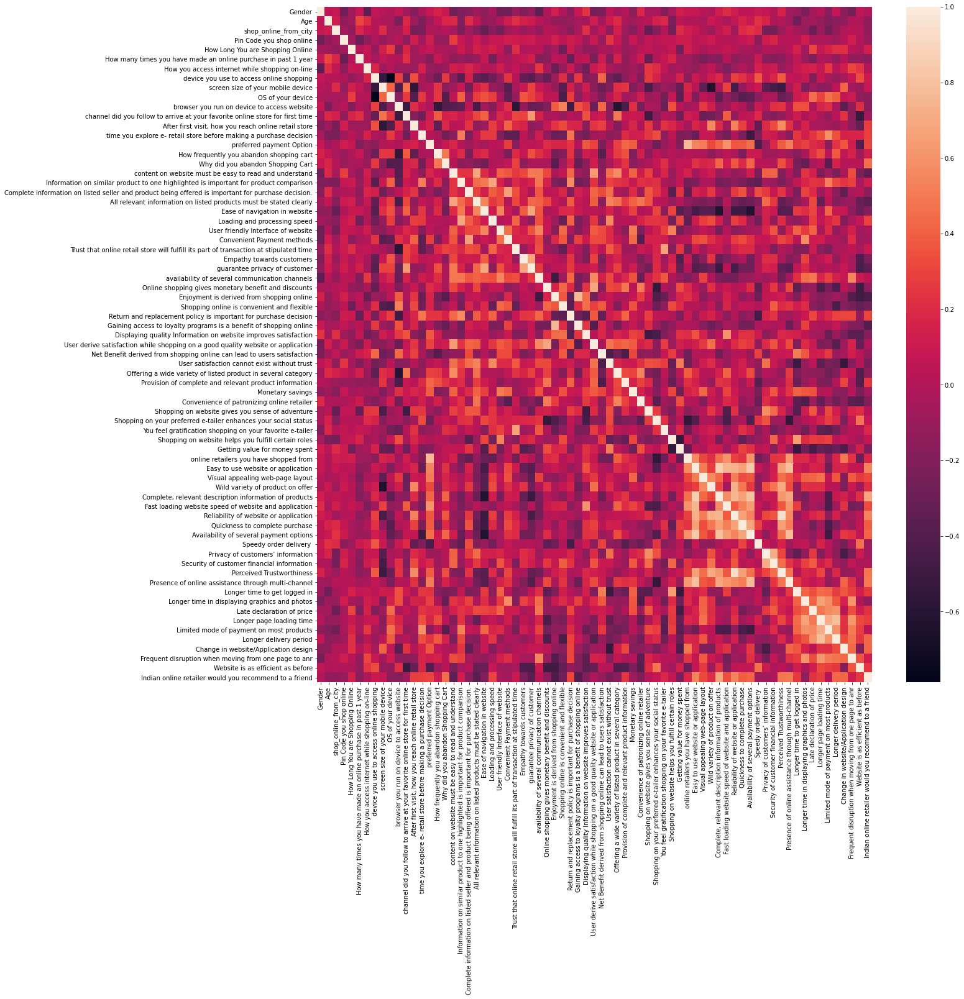

In [35]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr())

In [36]:
df.describe()

,Gender,Age,shop_online_from_city,Pin Code you shop online,How Long You are Shopping Online,How many times you have made an online purchase in past 1 year,How you access internet while shopping on-line,device you use to access online shopping,screen size of your mobile device,OS of your device,browser you run on device to access website,channel did you follow to arrive at your favorite online store for first time,"After first visit, how you reach online retail store",time you explore e- retail store before making a purchase decision,preferred payment Option,How frequently you abandon shopping cart,Why did you abandon Shopping Cart,content on website must be easy to read and understand,Information on similar product to one highlighted is important for product comparison,Complete information on listed seller and product being offered is important for purchase decision.,All relevant information on listed products must be stated clearly,Ease of navigation in website,Loading and processing speed,User friendly Interface of website,Convenient Payment methods,Trust that online retail store will fulfill its part of transaction at stipulated time,Empathy towards customers,guarantee privacy of customer,availability of several communication channels,Online shopping gives monetary benefit and discounts,Enjoyment is derived from shopping online,Shopping online is convenient and flexible,Return and replacement policy is important for purchase decision,Gaining access to loyalty programs is a benefit of shopping online,Displaying quality Information on website improves satisfaction,User derive satisfaction while shopping on a good quality website or application,Net Benefit derived from shopping online can lead to users satisfaction,User satisfaction cannot exist without trust,Offering a wide variety of listed product in several category,Provision of complete and relevant product information,Monetary savings,Convenience of patronizing online retailer,Shopping on website gives you sense of adventure,Shopping on your preferred e-tailer enhances your social status,You feel gratification shopping on your favorite e-tailer,Shopping on website helps you fulfill certain roles,Getting value for money spent,online retailers you have shopped from,Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,Longer time to get logged in,Longer time in displaying graphics and photos,Late declaration of price,Longer page loading time,Limited mode of payment on most products,Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to anr,Website is as efficient as before,Indian online retailer would you recommend to a friend
count,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000,269.000000
mean,0.327138,1.330855,4.494424,18.163569,2.323420,3.237918,1.267658,1.501859,2.256506,

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
 #   Column                                                                                               Non-Null Count  Dtype
---  ------                                                                                               --------------  -----
 0   Gender                                                                                               269 non-null    int64
 1   Age                                                                                                  269 non-null    int64
 2   shop_online_from_city                                                                                269 non-null    int64
 3   Pin Code you shop online                                                                             269 non-null    int64
 4   How Long You are Shopping Online                                                                     269 non-null    int64

<AxesSubplot:>

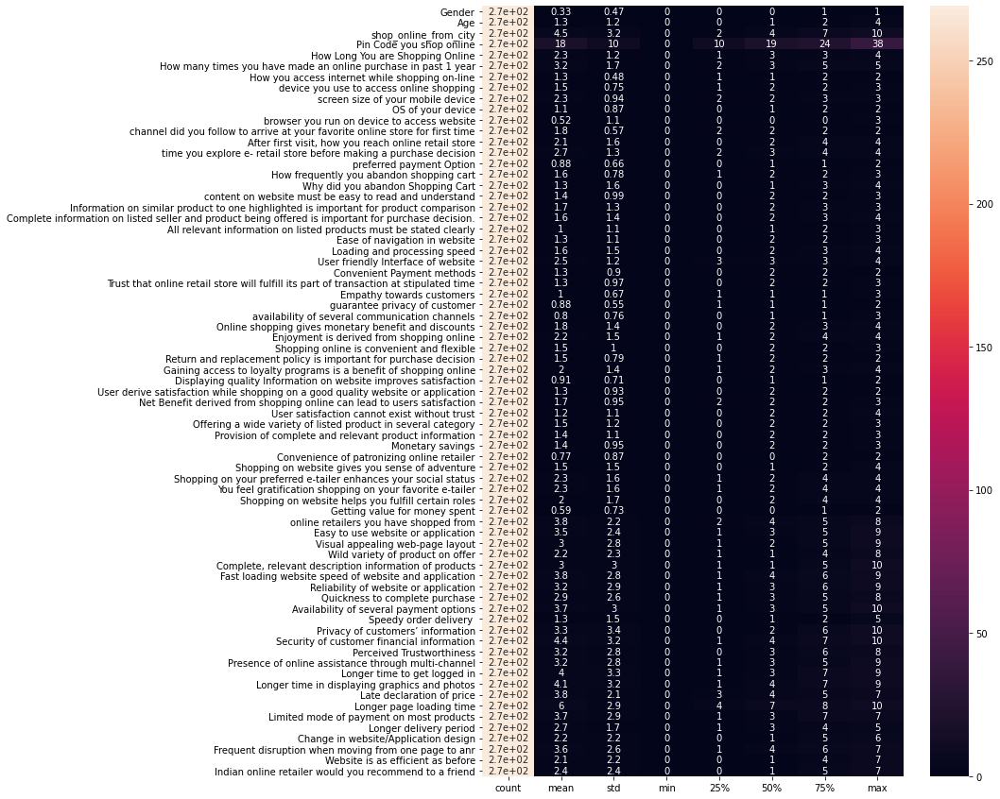

In [38]:
plt.figure(figsize=(10,15))
sns.heatmap(df.describe().T,annot=True)

<AxesSubplot:>

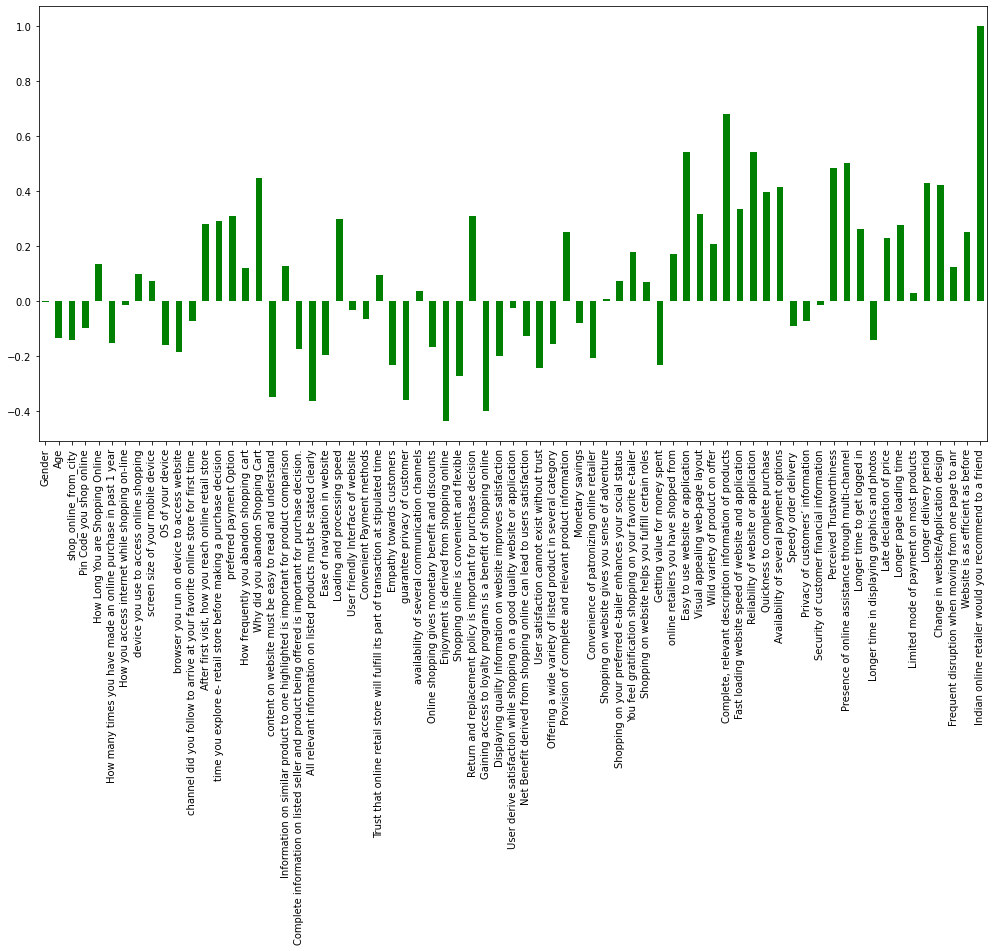

In [39]:
plt.figure(figsize=(17,8))
df.corr()[target_column_name].plot(kind='bar',color='green')

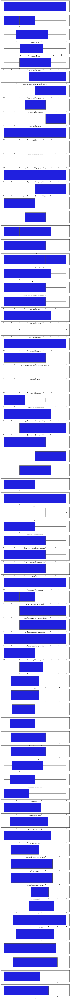

In [40]:
plt.figure(figsize=(17,250))
for i,one_column in enumerate(df.columns):
    plt.subplot(len(df.columns),1,i+1)
    sns.boxplot(df[one_column],color='blue')

In [41]:
df.skew().sort_values()

channel did you follow to arrive at your favorite online store for first time                         -2.469485
screen size of your mobile device                                                                     -1.308503
Return and replacement policy is important for purchase decision                                      -1.305697
User friendly Interface of website                                                                    -1.270908
How frequently you abandon shopping cart                                                              -0.867449
Net Benefit derived from shopping online can lead to users satisfaction                               -0.785908
Longer page loading time                                                                              -0.708594
User derive satisfaction while shopping on a good quality website or application                      -0.704827
Convenient Payment methods                                                                            -0

<AxesSubplot:>

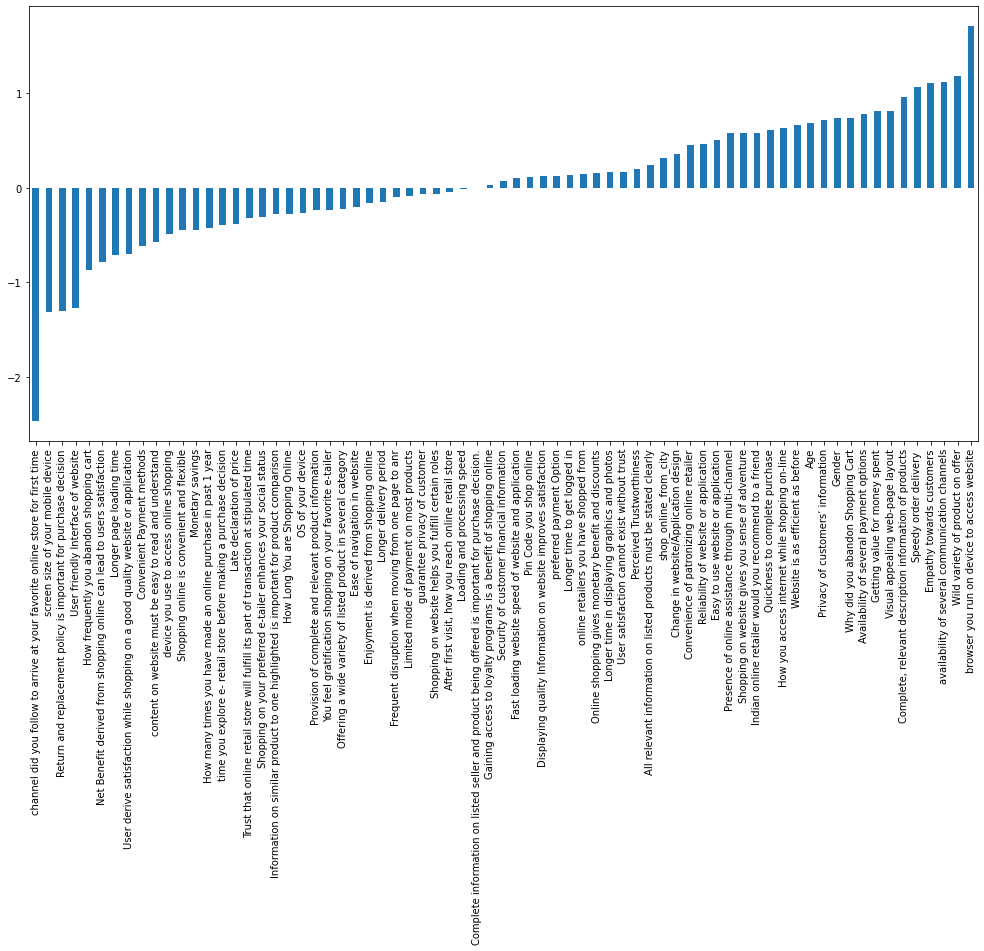

In [42]:
plt.figure(figsize=(17,8))
df.skew().sort_values().plot(kind='bar')

# Key Points

1. There is 71 column and 269 rows
2. In the this Female 181 Male 88 
3. Female do more shoping than man
4. Age group of 21-30 and 31-40 do more shoping than others
5. Most of the shoping are done from Delhi itelf
6. 201308 Pin code do more shoping then others
7. Most people are shoping form 4 years or more
8. Most people made shoping less than 10 times in year
9. Most of people use mobile internet for shoping
10. Most of the people order from smartphone
11. Most people use chrome browser for shoping
12. Most of people search in search engine to reach the shoping site
13. Most of people explore more than 15 minutes before purchage
14. Most of people order from credit/debit card while paying
15. reason of leaving the cart is because they find other good option
16. Most people Strongly Agree that "Return and replacement" should be there
17. Some People feel lack of trust in flipkart and some didn't found any preferred mode of payment in amazon